### Calibration & undistortion
- Task 1, Compute camera calibration matrix and distortion coefficients 
- Taks 2, Apply a distortion correction to raw images

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

(-0.5, 1279.5, 719.5, -0.5)

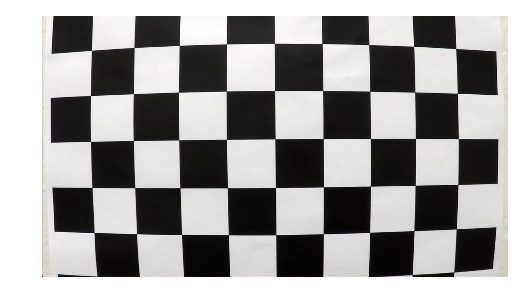

In [2]:
# Read a calibration sample
IMG_FOLDER = './camera_cal/'
test = plt.imread(IMG_FOLDER + 'calibration1.jpg')
plt.imshow(test)
plt.axis('off')

In [3]:
# Array to store object points and image points from all calibration images

import glob

objpoints = [] # 3D points of chessboard in real world, assuming chessboard is fixed on (x,y) plane with z=0
imgpoints = [] # 2D points in image plane 


# chessboard size
chess_size = (9, 6)

# prepare object points like (0,0,0), (1,0,0) ...(8,5,0)
objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x,y coordinate

images = glob.glob(IMG_FOLDER+'*')

#for name in frame_file:
#    print (name)

for frame in images:
    img = cv2.imread(frame)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, chess_size, None)
    
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
# Calculation the camera calibration matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[: : -1], None, None)
print('Camera calibration matrix is:')
print(mtx)

def cal_undistort(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)   
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undist = np.copy(dst)
    return undist

Camera calibration matrix is:
[[  1.15396093e+03   0.00000000e+00   6.69705357e+02]
 [  0.00000000e+00   1.14802496e+03   3.85656234e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


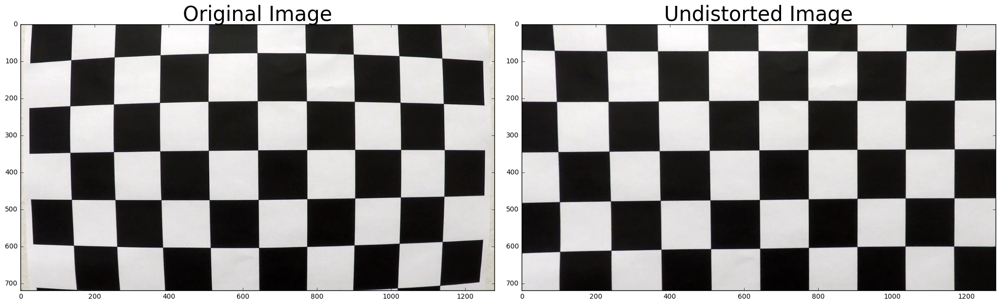

In [4]:
test_undist = cal_undistort(test)

# Plot result
f2, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,12))
f2.tight_layout()
ax1.imshow(test)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(test_undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

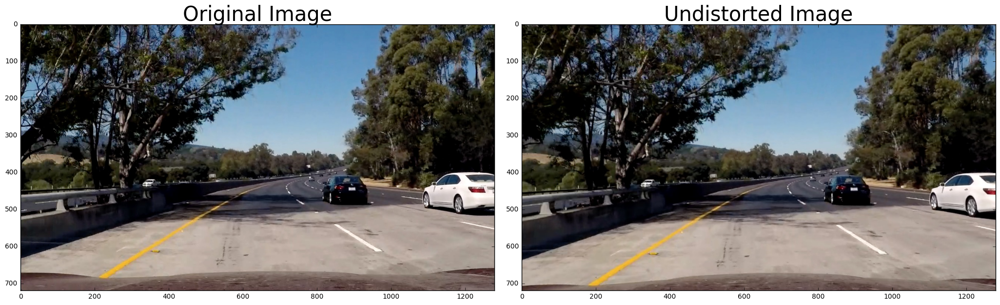

In [5]:
# Distortion correction of one image
sample_dir = './test_images/test5.jpg'
sample_image = plt.imread(sample_dir)
sample_undist = cal_undistort(sample_image)

# Plot result
f2, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,12))
f2.tight_layout()
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(sample_undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)


### Color Transform, gradients => Thresholded binary image
- Task 1, Combined color and gradient thresholds for lane detection
- Taks 2, Detect different colors of lane lines under varying degrees of daylight and shadow

In [6]:
# Color Space Transformation to HLS space (hue lightness, saturation)
# Function thresholds the S-channel of HLS

def hls_thresh(img, s_thresh=(0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:, :, 2]
    binary_output = np.zeros_like(s)
    binary_output[(s >= s_thresh[0]) & (s <= s_thresh[1])] =1
    return binary_output

In [7]:
# Canny (dx+dy) => Sobel operator (dx or dy)
# Pick up lane lines (steep edges)

# Combined Threshold

# Identify pixels where gradient of an image falls within  a specified threshold range
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    if orient =='y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] =1
    return binary_output


# Magntude of the gradient in both x and y (the core idea of Canny, picking up all edges)
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0,225)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # take the gradient in x and y seperately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    # caculate the magnitude
    abs_sobelxy =np.sqrt(sobel_x**2 + sobel_y**2)
    
    scaled_sobel = np.uint8(abs_sobelxy*255/np.max(abs_sobelxy))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output


# Direction of gradient (edges in paticular orientation)
def dir_thresh(img, sobel_kernel=3, thresh=(0,np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    
    abs_sobelx = np.absolute(sobel_x)
    abs_sobely = np.absolute(sobel_y)
    
    dir =np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(dir)
    binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] =1
    return binary_output


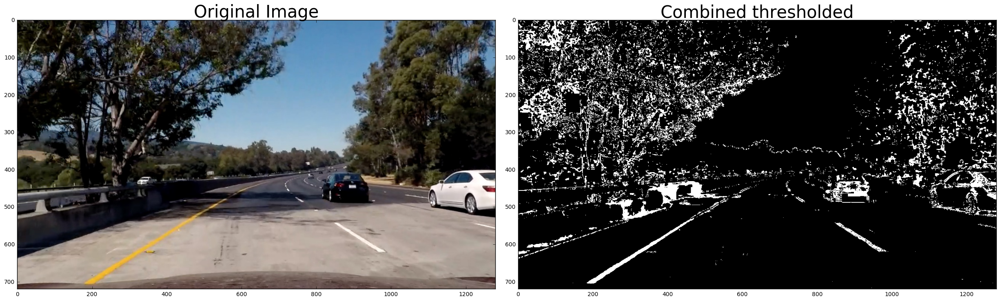

In [8]:
# Test an example image to choos a good image

sample_img = sample_undist

# Sobel kernel size
ksize = 3

# Apply each of the thresholing function
gradx = abs_sobel_thresh(sample_img, orient= 'x', thresh=(30,255))
grady = abs_sobel_thresh(sample_img, orient= 'y', thresh=(30,255))
mag_binary = mag_thresh(sample_img, sobel_kernel=ksize, mag_thresh=(50,255))
dir_binary = dir_thresh(sample_img, sobel_kernel=ksize, thresh=(0.7, 1.3))
s_binary = hls_thresh(sample_img, (165, 255))

# Combining thresholds
combined = np.zeros_like(dir_binary)

combined[ (s_binary == 1) | (gradx == 1) & (grady == 1)  | ((mag_binary == 1) & (dir_binary == 1 ))] = 1

# Plot result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(sample_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap ='gray')
ax2.set_title('Combined thresholded', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

In [9]:
# combined function to undistored image
def combined_thresh(sample_img):
    
    # Sobel kernel size
    ksize = 3
    # Apply each of the thresholing function
    gradx = abs_sobel_thresh(sample_img, orient= 'x', thresh=(30,255))
    grady = abs_sobel_thresh(sample_img, orient= 'y', thresh=(30,255))
    mag_binary = mag_thresh(sample_img, sobel_kernel=ksize, mag_thresh=(50,255))
    dir_binary = dir_thresh(sample_img, sobel_kernel=ksize, thresh=(0.7, 1.3))
    s_binary = hls_thresh(sample_img, (165, 255))

    # Combining thresholds
    combined = np.zeros_like(dir_binary)
    combined[ (s_binary == 1) | (gradx == 1)& (grady == 1) | ((mag_binary == 1) & (dir_binary == 1 ))] = 1
    return combined

### Perspective Transformation => birds-eye view
- Task, Apply a perspective transformation to rectify binary image to have a top down view

In [10]:
def warp(img):
    
    row = img.shape[0] #height
    col = img.shape[1] #width
    img_size = (col, row)
    
    
    src = np.float32(
            [[203,720],
            [1127,720],
            [585,460],
            [695,460]])
        
    dst = np.float32(
            [[320,720],
            [960,720],
            [320,0],
            [960,0]])

    # Transformation matrix
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Inverse Transformation
    M_inv = cv2.getPerspectiveTransform(dst, src)  
    return warped, M_inv

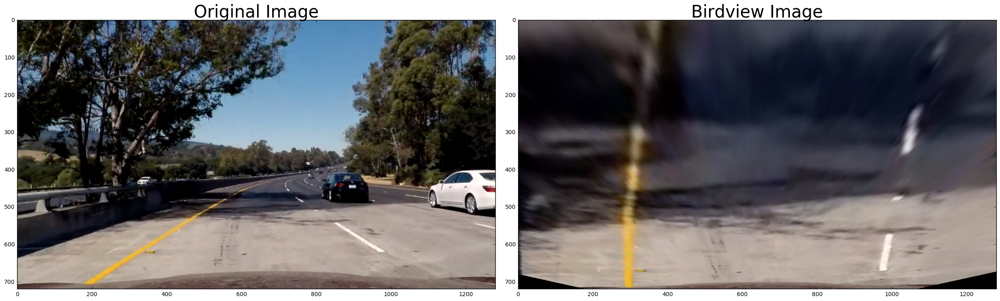

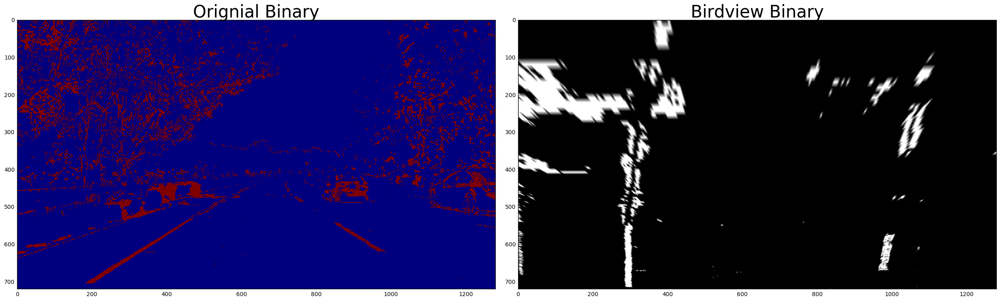

In [11]:
# Plot example result
warped, Minv = warp(sample_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(sample_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped, cmap ='gray')
ax2.set_title('Birdview Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

#Plot combined
warped2, Minv2 = warp(combined)
#Plot example result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(combined)
ax1.set_title('Orignial Binary', fontsize=30)
ax2.imshow(warped2, cmap ='gray')
ax2.set_title('Birdview Binary', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

### Detect lane lines pixels and fit to find the lane boundary

/home/li/anaconda2/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


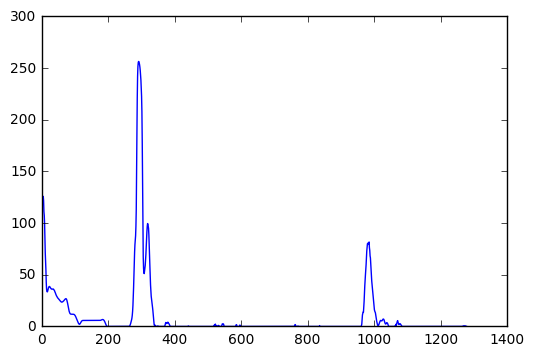

In [12]:
# Histogram Peaks
warp_binary, Minv = warp(combined)
# Take half region to find hot pixel of lane
histogram = np.sum(warp_binary[warp_binary.shape[0]/2:,:], axis = 0)
plt.plot(histogram)

In [13]:
# Implement sliding windows and fit a polynomial
# img is binary_warped

def fit_line(img):
    
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    # Create an output image to drow on and visualize the result
    out_img = (np.dstack((img, img, img))*255).astype('uint8')
    
    # Find peak of left/right halves of the histogram and fix starting point
    midpoint = np.int(histogram.shape[0]/2) # histogram is one dimension
    leftx_base = np.argmax(histogram[100:midpoint])+100
    rightx_base = np.argmax(histogram[midpoint:-100])+midpoint

    # Num of sliding window
    nwindows = 9
    # Height of the window
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the window +/-margin
    margin = 80
    # Set the minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2) #green
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2)
        
        # Identify the nonzero pixels in x and y  within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append indices to list
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean positions
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0] # red
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255] #blue
    
    # Save result in a dictionary
    res = {}
    res['out_img'] = out_img
    res['left_fit'] = left_fit
    res['right_fit'] = right_fit
    res['left_lane_inds'] = left_lane_inds
    res['right_lane_inds'] = right_lane_inds
    res['nonzerox'] = nonzerox
    res['nonzeroy'] = nonzeroy
    
    return res   

/home/li/anaconda2/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


(720, 0)

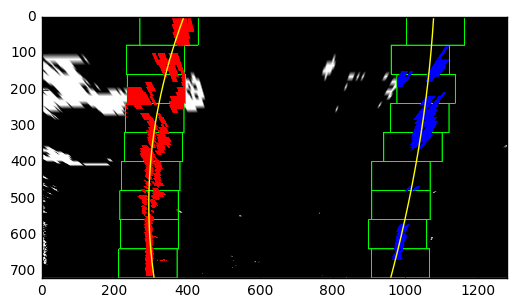

In [14]:
#Plot an example
res = fit_line(warp_binary)
out_img = res['out_img']
left_fit = res['left_fit']
right_fit = res['right_fit']

# Generate x and y values for plotting
ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [15]:
# Skip the sliding windows step once the line are known
def quick_fit(img, left_fit, right_fit):
    # Assume you now have a new warped binary image from next frame
    # It's much easier to find line pixels
    nonzero = img.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    margin = 80
    poly_left = left_fit[0]* nonzeroy**2 + left_fit[1] * nonzeroy + left_fit[2]
    poly_right = right_fit[0]* nonzeroy**2 + right_fit[1] * nonzeroy + right_fit[2]
    
    left_lane_inds = ((nonzerox > (poly_left - margin)) & (nonzerox <(poly_left + margin)))
    right_lane_inds = ((nonzerox > (poly_right - margin)) & (nonzerox <(poly_right + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Create an image to draw on and an image to show the selection window
    out_img = (np.dstack((img, img, img))*255).astype('uint8')
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Save result in a dictionary
    res = {}
    res['out_img'] = out_img
    res['left_fit'] = left_fit
    res['right_fit'] = right_fit
    res['left_lane_inds'] = left_lane_inds
    res['right_lane_inds'] = right_lane_inds
    res['nonzerox'] = nonzerox
    res['nonzeroy'] = nonzeroy
    
    return res

(720, 0)

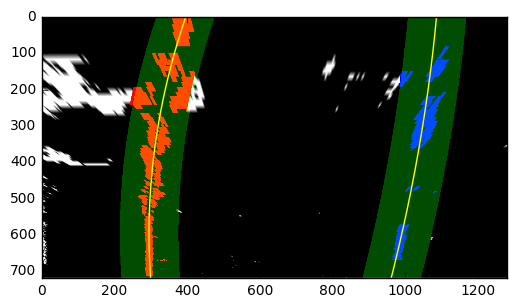

In [16]:
#Plot an example
res = quick_fit(warp_binary, left_fit, right_fit)
out_img = res['out_img']
left_fit = res['left_fit']
right_fit = res['right_fit']

margin = 80

window_img = np.zeros_like(out_img)

# Generate x and y values for plotting
ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0) #transparency
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)    

###  Calculate Curvature and  Position Offset 
- Determin the curvature of the lane and vehicle position with respect to center
- Camera is mounted at the center of the car, such that the lane center is midpoint of two detected line, the offset of image and midpoint is the offset distance

In [17]:
def cal_curvarad(res):
    
    out_img = res['out_img']
    nonzerox = res['nonzerox']
    nonzeroy = res['nonzeroy']
    left_lane_inds = res['left_lane_inds']
    right_lane_inds = res['right_lane_inds']
        
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    
    #left_curverad_pix = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    #right_curverad_pix = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Transfer from pixel space to the real world space
    # Define coversion in x and y from pixels space to meters
    ym_per_pix = 30/720  #meters per pixel in y dimension
    xm_per_pix = 3.7/700 #meters per pxiel in x dimension
    
    # Choose the maximum y-value, corresponding to the bottom of the image
    y_eval = 719
    y_eval_m = y_eval*ym_per_pix
    
    # Fit new polynomials to x, y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_m + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_m + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    return left_curverad, right_curverad

In [18]:
def cal_offset(res):
    
    img = res['out_img']
    left_fit = res['left_fit']
    right_fit = res['right_fit']

    # Find the low_x position for two lane
    y = img.shape[0] -1
    x_left = left_fit[0]*y**2 + left_fit[1]* y + left_fit[2]
    x_right = right_fit[0]*y**2 + right_fit[1]* y + right_fit[2]
    
    offset_pix = img.shape[1]/2 - (x_left + x_right)/2
    
    # converse to meters
    xm_per_pix = 3.7/700
    offset_m = offset_pix * xm_per_pix
    return offset_m

In [19]:
# Test on example
res2 = fit_line(warp_binary)
print('Radius of curvature is', cal_curvarad(res2), 'm;', 'Vehicle position wrt lane center is', cal_offset(res2))

Radius of curvature is (455.39383452229998, 1154.2319740026599) m; Vehicle position wrt lane center is 0.0299392153947


/home/li/anaconda2/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


### Final visualization and tune 
- Warp the detected lane boundaries back onto the original image

In [20]:
# Final Visualization

def visualize(image, res, Minv, left_curve, right_curve, offset):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    
    left_fit = res['left_fit']
    right_fit = res['right_fit']
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    # Create a blank image to draw the lines on
    #warp_zero = np.zeros_like(image).astype('uint8')
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    color_warp = np.zeros((720,1280,3),dtype='uint8')
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose((np.vstack([right_fitx, ploty]))))])
    
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]),(0,255,0))
    
    # Warp the blank back to original image space using inverse perspective matrix  (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combined the result with the original image
    result = cv2. addWeighted(image, 1, newwarp, 0.3, 0)
    
    # Write the annotation of curvature and offset
    # Average curvature
    cuvavg = (left_curve + right_curve) / 2
    label1 = 'Average Radius of curvature: %.1f m' % cuvavg
    label2 = 'Vehicle Offset from lane center: %.1f m' %offset
    
    cv2.putText(result, label1, (20, 30), 0, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, label2, (20, 60), 0, 1, (255,255,255), 2, cv2.LINE_AA)
    
    return result

/home/li/anaconda2/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


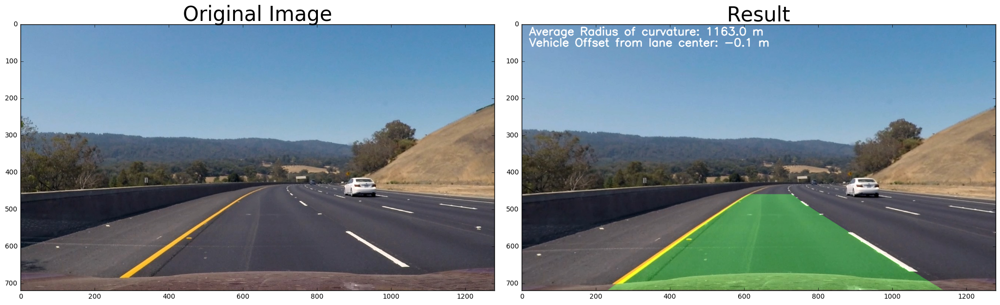

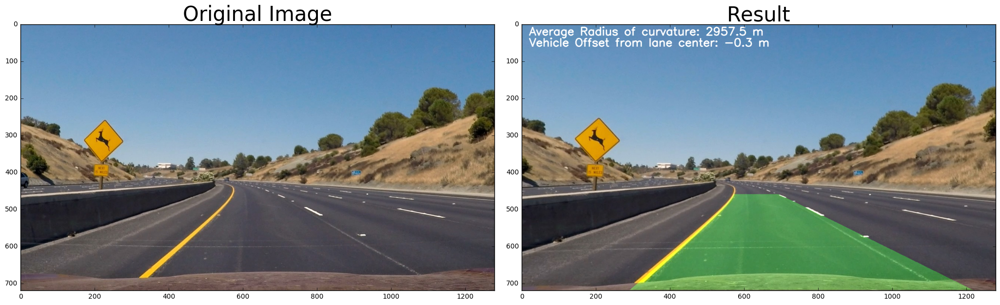

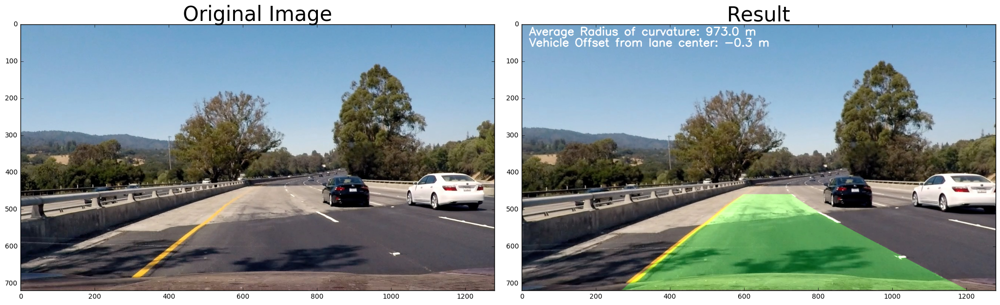

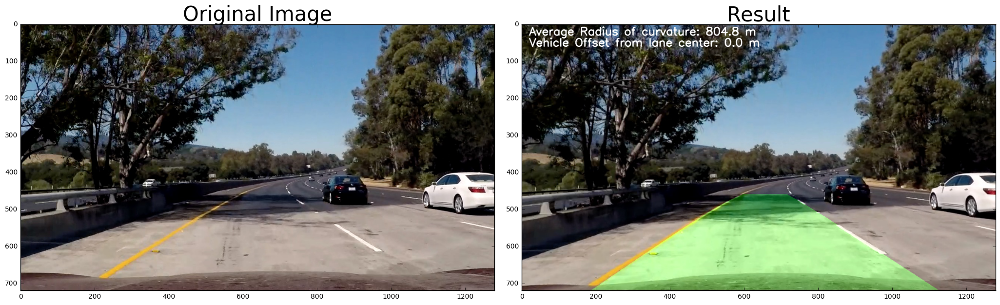

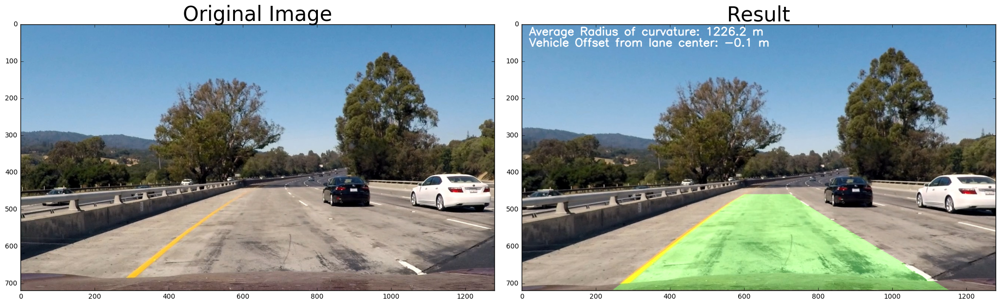

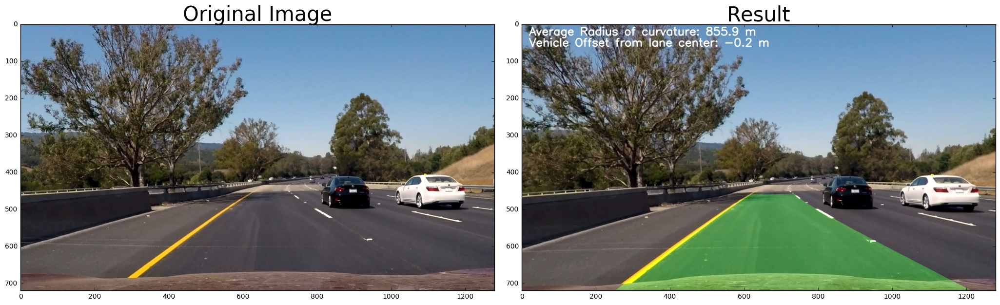

In [21]:
# Test the pipeline and the visualize function

for path in glob.glob('./test_images/test*.jpg'):

    image = plt.imread(path)
    undist = cal_undistort(image)
    combined = combined_thresh(undist)
    warped, Minv = warp(combined)
    res = fit_line(warped)
    left_curve, right_curve = cal_curvarad(res)
    offset = cal_offset(res)
    result = visualize(undist, res, Minv, left_curve, right_curve, offset)

    # Plot result
    f2, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,12))
    f2.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(result)
    ax2.set_title('Result', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0)

### Works on a video stream
- Tuning pipeline on test images
- Working on the video and output result
- To do this, it is useful to defin a Line() class to keep track of all the interesting params that are measured from frame to frame

In [22]:
class Line():
    def __init__(self,n):
        # was the line detected in the last iteration
        self.detected = False
        # n frame is sufficient for a param averaging
        self.n = n
        
        # polynomial coefficient A, B, C
        self.A = []
        self.B = []
        self.C = []
        
        # average of above
        self.A_mean = 0.
        self.B_mean = 0.
        self.C_mean = 0.
    
    def get_before(self):
        return (self.A_mean, self.B_mean, self.C_mean)
    
    def smooth_fit(self, coeffs):
        
        self.A.append(coeffs[0])
        self.B.append(coeffs[1])
        self.C.append(coeffs[2])
        
        if len(self.A) >= self.n:
            self.A.pop(0) #remove the first entry in the list
            self.B.pop(0)
            self.C.pop(0)
            
        self.A_mean = np.mean(self.A)
        self.B_mean = np.mean(self.B)
        self.C_mean = np.mean(self.C)
            
        return (self.A_mean, self.B_mean, self.C_mean)

In [23]:
numFrame = 10 #num of frame to smooth params
left_lane = Line(n=numFrame)
right_lane = Line(n=numFrame)
detected = False

In [24]:
# Final Pipeline

def pipeline(image):
    
    global left_lane, right_lane, detected
    
    # Undistorsion
    undist = cal_undistort(image)
    
    # Combined color/dir/color thresh
    combined = combined_thresh(undist)
    
    # Birdview transformation
    warped, Minv = warp(combined)
    
    # Detection lane
    if not detected:
        # First fit polynominal
        res = fit_line(warped)
        left_fit = res['left_fit']
        right_fit = res['right_fit']
        
        # Smoothing
        left_fit = left_lane.smooth_fit(left_fit)
        right_fit = right_lane.smooth_fit(right_fit)
        
        # Annotation
        left_curve, right_curve =  cal_curvarad(res)
        offset = cal_offset(res)
        
        # Update
        detected = True
    else:
        # Quick fit
        left_fit = left_lane.get_before()
        right_fit = right_lane.get_before()
        res = quick_fit(warped, left_fit, right_fit)
        
        if res is not None:
            left_fit = res['left_fit']
            right_fit = res['right_fit']
            
            # Smoothing
            left_fit = left_lane.smooth_fit(left_fit)
            right_fit = right_lane.smooth_fit(right_fit)
            
            # Annotation
            left_curve, right_curve =  cal_curvarad(res)
            offset = cal_offset(res)
        else:
            detected = False
        
    result = visualize(undist, res, Minv, left_curve, right_curve, offset)
    
    return result

In [25]:
# Test on video
from moviepy.editor import VideoFileClip

video = VideoFileClip('./project_video.mp4')
new_video = video.fl_image(lambda image: pipeline(image))
new_video.write_videofile('./result.mp4',audio=False)

[MoviePy] >>>> Building video ./result.mp4
[MoviePy] Writing video ./result.mp4


100%|█████████▉| 1260/1261 [06:04<00:00,  3.55it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result.mp4 

